In [1]:
import pandas as pd
import pygmt
from matplotlib.colors import to_hex
import matplotlib.pyplot as plt
from matplotlib.colors import to_hex
from matplotlib.colors import ListedColormap
import seaborn as sns
import numpy as np
from scipy.stats import linregress

In [2]:
geo_wa=pd.read_csv('./geological_map/waor_station_geology.csv')
geo_wa.head(5)

,netst,stlo,stla,geometry,index_right,STATE,ORIG_LABEL,SGMC_LABEL,UNIT_LINK,UNIT_NAME,...,INDETERMIN,REF_ID,REFERENCE,GENERALIZE,DIGITAL_UR,NGMDB1,NGMDB2,NGMDB3,RuleID,FIPS_C
0,CC.ASBU,-121.368401,43.820560,POINT (-121.368401 43.82056),9310.0,OR,Qyb,Qyb;0,ORQyb;0,Youngest basalt and basaltic andesite,...,NaN,OR392,"Miller, R.J., Raines, G.L., and Connors, K.A.,...","Igneous, volcanic",https://pubs.usgs.gov/of/2003/of03-067/,https://ngmdb.usgs.gov/Prodesc/proddesc_16259.htm,NaN,NaN,2.0,41.0
1,CC.BRSP,-121.708427,45.401550,POINT (-121.708427 45.40155),5175.0,OR,Qa,Qa;0,ORQa;0,Andesite,...,NaN,OR392,"Miller, R.J., Raines, G.L., and Connors, K.A.,...","Igneous, volcanic",https://pubs.usgs.gov/of/2003/of03-067/,https://ngmdb.usgs.gov/Prodesc/proddesc_16259.htm,NaN,NaN,2.0,41.0
2,CC.CARB,-122.005409,46.988319,POINT (-122.005409 46.988319),310.0,WA,E2,EO2;0,WAEO2;0,Lower upper Eocene marine and nonmarine rocks,...,NaN,WA097,"Raines, Gary L., and Johnson, Bruce R., 1996, ...","Sedimentary, clastic",https://pubs.usgs.gov/of/1995/of95-684/,https://ngmdb.usgs.gov/Prodesc/proddesc_30777.htm,NaN,NaN,23.0,53.0
3,CC.CIHL,-121.148621,43.750969,POINT (-121.148621 43.750969),5796.0,OR,Qb,Qb;0,ORQb;0,Basalt and basaltic andesite,...,NaN,OR392,"Miller, R.J., Raines, G.L., and Connors, K.A.,...","Igneous, volcanic",https://pubs.usgs.gov/of/2003/of03-067/,https://ngmdb.usgs.gov/Prodesc/proddesc_16259.htm,NaN,NaN,2.0,41.0
4,CC.CLBH,-122.143494,42.907745,POINT (-122.143494 42.907745),5168.0,OR,Qa,Qa;0,ORQa;0,Andesite,...,NaN,OR392,"Miller, R.J., Raines, G.L., and Connors, K.A.,...","Igneous, volcanic",https://pubs.usgs.gov/of/2003/of03-067/,https://ngmdb.usgs.gov/Prodesc/proddesc_16259.htm,NaN,NaN,2.0,41.0


In [3]:
geo_ca=pd.read_csv('./geological_map/ca_station_geology.csv')
geo_ca.head(5)

,netst,stla,stlo,geometry,index_right,STATE,ORIG_LABEL,SGMC_LABEL,UNIT_LINK,UNIT_NAME,...,INDETERMIN,REF_ID,REFERENCE,GENERALIZE,DIGITAL_UR,NGMDB1,NGMDB2,NGMDB3,RuleID,FIPS_C
0,CI.ALP,34.687080,-118.299461,POINT (-118.299461 34.68708),4810,CA,Q,Q;0,CAQ;0,Quaternary alluvium and marine deposits,...,NaN,CA294,"Jennings, C.W., with modifications by Gutierre...","Unconsolidated, undifferentiated",ftp://ftp.consrv.ca.gov/pub/dmg/rgmp/Published...,https://ngmdb.usgs.gov/Prodesc/proddesc_96750.htm,NaN,NaN,29,6
1,CI.ARV,35.126900,-118.830093,POINT (-118.830093 35.1269),2786,CA,M,MI;0,CAMI;0,Miocene marine rocks,...,NaN,CA294,"Jennings, C.W., with modifications by Gutierre...","Sedimentary, clastic",ftp://ftp.consrv.ca.gov/pub/dmg/rgmp/Published...,https://ngmdb.usgs.gov/Prodesc/proddesc_96750.htm,NaN,NaN,23,6
2,CI.BAI,34.776951,-118.773354,POINT (-118.773354 34.776951),2829,CA,M,MI;0,CAMI;0,Miocene marine rocks,...,NaN,CA294,"Jennings, C.W., with modifications by Gutierre...","Sedimentary, clastic",ftp://ftp.consrv.ca.gov/pub/dmg/rgmp/Published...,https://ngmdb.usgs.gov/Prodesc/proddesc_96750.htm,NaN,NaN,23,6
3,CI.BAK,35.344440,-119.104446,POINT (-119.104446 35.34444),4830,CA,Q,Q;0,CAQ;0,Quaternary alluvium and marine deposits,...,NaN,CA294,"Jennings, C.W., with modifications by Gutierre...","Unconsolidated, undifferentiated",ftp://ftp.consrv.ca.gov/pub/dmg/rgmp/Published...,https://ngmdb.usgs.gov/Prodesc/proddesc_96750.htm,NaN,NaN,29,6
4,CI.BBR,34.262299,-116.920753,POINT (-116.920753 34.262299),4848,CA,Q,Q;0,CAQ;0,Quaternary alluvium and marine deposits,...,NaN,CA294,"Jennings, C.W., with modifications by Gutierre...","Unconsolidated, undifferentiated",ftp://ftp.consrv.ca.gov/pub/dmg/rgmp/Published...,https://ngmdb.usgs.gov/Prodesc/proddesc_96750.htm,NaN,NaN,29,6


In [4]:
geo_in=pd.concat([geo_wa,geo_ca])

In [5]:
geo_df=geo_in[['netst',
               'stlo',
               'stla',
               'STATE',
               'GENERALIZE',
               'MAJOR1']]

In [6]:
geo_df.dropna(subset=['GENERALIZE'],inplace=True)

/tmp/ipykernel_3536192/2092695932.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  geo_df.dropna(subset=['GENERALIZE'],inplace=True)


In [7]:
rock_types=geo_df['GENERALIZE'].unique()
rock_types

array(['Igneous, volcanic', 'Sedimentary, clastic',
       'Unconsolidated, undifferentiated', 'Igneous, undifferentiated',
       'Igneous, intrusive',
       'Metamorphic and Sedimentary, undifferentiated',
       'Metamorphic, sedimentary', 'Water',
       'Igneous and Sedimentary, undifferentiated',
       'Metamorphic, serpentinite', 'Metamorphic, schist',
       'Metamorphic, sedimentary clastic',
       'Unconsolidated and Sedimentary, undifferentiated',
       'Sedimentary, carbonate', 'Metamorphic, volcanic',
       'Metamorphic, gneiss', 'Igneous and Metamorphic, undifferentiated',
       'Sedimentary, undifferentiated'], dtype=object)

In [8]:
geo_df2 = geo_df.dropna(subset=['stlo', 'stla', 'GENERALIZE'])

geo_colors = {
    # **Unconsolidated Rocks** (Yellow to orange gradient)
    'Unconsolidated, undifferentiated': '#FFEB3B',   # Bright yellow (light yellow)
    'Unconsolidated and Sedimentary, undifferentiated': '#FF9800',  # Orange (for undifferentiated sediments)

    # **Sedimentary Rocks** (Yellow-based to orange and brown tones)
    'Sedimentary, clastic': '#FFB300',               # Amber yellow (clastic sedimentary)
    'Sedimentary, carbonate': '#FBC02D',             # Golden yellow (carbonate sedimentary)
    'Sedimentary, undifferentiated': '#F57C00',      # Burnt orange (undifferentiated sedimentary)

    # **Igneous Rocks** (Red-based for volcanic and purple-based for intrusive)
    'Igneous, volcanic': '#D32F2F',                  # Deep red (for volcanic)
    'Igneous, intrusive': '#9C27B0',                 # Purple-based (for intrusive igneous)
    'Igneous, undifferentiated': '#E57373',          # Light red (undifferentiated igneous)
    'Igneous and Sedimentary, undifferentiated': '#F06292', # Pinkish red (mixed igneous and sedimentary)

    # **Metamorphic Rocks** (Green-based with variations)
    'Metamorphic, sedimentary': '#66BB6A',           # Light green (for sedimentary metamorphics)
    'Metamorphic, schist': '#2E7D32',                # Deep green (for schist)
    'Metamorphic, serpentinite': '#81C784',          # Soft green (for serpentinite)
    'Metamorphic, volcanic': '#388E3C',              # Forest green (for volcanic metamorphics)
    'Metamorphic, gneiss': '#1B5E20',                # Dark green (for gneiss)
    'Metamorphic and Sedimentary, undifferentiated': '#43A047', # Medium green (undifferentiated metamorphics)
    'Metamorphic, sedimentary clastic': '#4CAF50',   # Fresh green (for clastic metamorphics)
    'Igneous and Metamorphic, undifferentiated': '#8E24AA', # Violet-green mix (for igneous/metamorphic undifferentiated)

    # **Water** (Clear and bright blue)
    'Water': '#80D8FF',                              # Soft turquoise-blue (for water)

    # **NaN or Missing Data** (Neutral gray)
    None: '#BDBDBD',                                 # Light gray for undefined or NaN entries
    # 'nan': '#BDBDBD'                                 # Handling 'nan' as a string explicitly if needed
}



# Map geological units to colors
geo_df2['color'] = geo_df2['GENERALIZE'].map(geo_colors).fillna('#d3d3d3') 


coast [WARNING]: 0/0.1 not a valid number and may not be decoded properly.


Unconsolidated, undifferentiated #FFEB3B
Unconsolidated and Sedimentary, undifferentiated #FF9800
Sedimentary, clastic #FFB300
Sedimentary, carbonate #FBC02D
Sedimentary, undifferentiated #F57C00
Igneous, volcanic #D32F2F
Igneous, intrusive #9C27B0
Igneous, undifferentiated #E57373
Igneous and Sedimentary, undifferentiated #F06292
Metamorphic, sedimentary #66BB6A
Metamorphic, schist #2E7D32
Metamorphic, serpentinite #81C784
Metamorphic, volcanic #388E3C
Metamorphic, gneiss #1B5E20
Metamorphic and Sedimentary, undifferentiated #43A047
Metamorphic, sedimentary clastic #4CAF50
Igneous and Metamorphic, undifferentiated #8E24AA
Water #80D8FF
None #BDBDBD


coast [WARNING]: 0/0.1 not a valid number and may not be decoded properly.


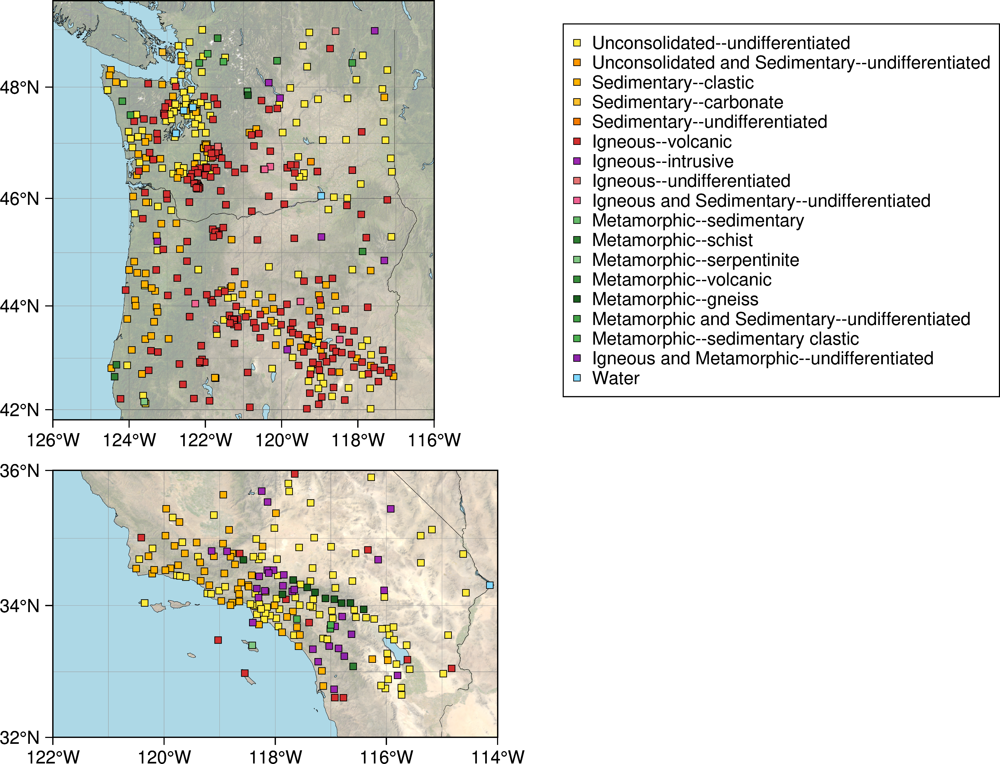

In [9]:
# PyGMT Plot
fig = pygmt.Figure()
region=[-126,-116,41.8,49.5]
proj='M6c'

pygmt.config(MAP_GRID_PEN = '0.01p,150' , MAP_FRAME_PEN='0.5p', MAP_FRAME_TYPE="plain", MAP_TITLE_OFFSET="0.12p", FONT_TITLE="12p", FONT_ANNOT='8p',  )
 
# Plot the basemap
fig.basemap(region=region,  projection=proj, frame="a2g1", )
grid = pygmt.datasets.load_earth_relief(resolution="30s", region=region)
fig.grdimage(grid='@earth_day_30s', projection=proj, transparency=60, )
fig.coast(region=region, projection=proj, frame="a2g1", resolution="f", borders="2/0.05p",
            water='lightblue', shorelines='0/0.1p',)

# Plot each geological unit as colored circles
for unit, color in geo_colors.items():
    print(unit, color)
    geo_plot = geo_df2[geo_df2['color'] == color]
    formatted_label = str(unit).replace(", ", "--")
    if not geo_plot.empty:
        fig.plot(
                x=geo_plot['stlo'],
                y=geo_plot['stla'],
                style="s0.15c",  
                fill=color,
                pen="black",
                label=f'{formatted_label}'
        )

fig.legend(position="JMR+o0.8i/0i", box="+gwhite+p0.4p")
# fig.shift_origin(xshift="7c")
fig.shift_origin(yshift="-5c")
proj='M7c'
region=[-122,-114,32,36]
pygmt.config(MAP_GRID_PEN = '0.01p,150' , MAP_FRAME_PEN='0.5p', MAP_FRAME_TYPE="plain", MAP_TITLE_OFFSET="0.12p", FONT_TITLE="12p", FONT_ANNOT='8p',  )
 
# Plot the basemap
fig.basemap(region=region,  projection=proj, frame="a2g1", )
grid = pygmt.datasets.load_earth_relief(resolution="30s", region=region)
fig.grdimage(grid='@earth_day_30s', projection=proj, transparency=60, )

fig.coast(region=region, projection=proj, frame="a2g1", resolution="f", borders="2/0.05p",
            water='lightblue', shorelines='0/0.1p',)
# Plot each geological unit as colored circles
for unit, color in geo_colors.items():
    # print(unit, color)
    geo_plot = geo_df2[geo_df2['color'] == color]
    formatted_label = str(unit).replace(", ", "--")
    if not geo_plot.empty:
        fig.plot(
            x=geo_plot["stlo"],
            y=geo_plot["stla"],
            style="s0.15c",
            fill=color,
            pen="black",
            label=f"{formatted_label}",  # Use formatted label
        )


fig.show(dpi=600)



In [10]:
print(geo_df.MAJOR1.unique())

['Basaltic-andesite' 'Siltstone' 'Basalt' 'Rhyolite' 'Sandstone' 'Clay'
 'Silt' 'Andesite' 'Sand' 'Fine-detrital' 'Quartz-monzonite' 'Granite'
 'Graywacke' 'Gravel' 'Metasedimentary' nan 'Arkose' 'Mudstone' 'Gabbro'
 'Sandstone-mudstone' 'Quartz-diorite' 'Coarse-detrital' 'Mixed-clastic'
 'Serpentinite' 'Pelitic-schist' 'Volcanic' 'Phyllite' 'Conglomerate'
 'Limestone' 'Greenstone' 'Gneiss' 'Metaandesite' 'Hypabyssal-basalt'
 'Plutonic' 'Orthogneiss' 'Shale' 'Anorthosite' 'Tonalite' 'Argillite'
 'Felsic-volcanic' 'Granodiorite' 'Diorite' 'Hypabyssal-rhyolite' 'Dacite']


In [11]:
geo_major = geo_df.dropna(subset=['stlo', 'stla', 'MAJOR1'])

# Define color dictionary for geological units
major_colors = {
    # **Sedimentary Rocks** (Yellow-based gradient, yellow to orange)
    'Siltstone': '#FFEB3B',              # Bright yellow
    'Sandstone': '#FFB300',              # Darker yellow-orange
    'Clay': '#FF6F00',                  # Deep amber-orange
    'Silt': '#FFF176',                  # Pale yellow (lighter)
    'Fine-detrital': '#FF9800',          # Strong orange
    'Graywacke': '#FF5722',             # Orange-red
    'Arkose': '#F57C00',                # Intense amber-orange
    'Mudstone': '#E65100',              # Dark amber-orange
    'Conglomerate': '#D32F2F',          # Red-orange
    'Limestone': '#FF7043',             # Peachy-orange
    'Sandstone-mudstone': '#FF5722',    # Reddish-orange
    'Mixed-clastic': '#E64A19',         # Orange-red
    'Coarse-detrital': '#BF360C',       # Dark orange-red
    'Shale': '#F9A825',                 # Amber-yellow with slight orange
    'Gravel': '#B59A5B',                # Beige with brown undertones
    'Argillite': '#FF6F00',             # Amber-orange
    'Sand': '#FFB300',                 # Darker yellow-orange

    # **Volcanic Rocks** (Purple-based gradient, dark purple to lavender)
    'Basaltic-andesite': '#512DA8',     # Dark purple
    'Basalt': '#3F51B5',                # Dark bluish purple
    'Rhyolite': '#5E35B1',              # Medium dark purple
    'Andesite': '#7E57C2',              # Medium purple
    'Granite': '#9C27B0',               # Vibrant purple
    'Volcanic': '#8E24AA',              # Purple-pink
    'Metaandesite': '#9C27B0',          # Rich purple
    'Hypabyssal-basalt': '#7B1FA2',     # Deep purple with pinkish tint
    'Hypabyssal-rhyolite': '#AB47BC',   # Lavender purple
    'Dacite': '#512DA8',                # Dark purple, same as basaltic-andesite
    'Granodiorite': '#4CAF50',          # Purple with brownish tones

    # **Metamorphic Rocks** (Green-based gradient)
    'Metasedimentary': '#66BB6A',       # Light green
    'Pelitic-schist': '#4CAF50',         # Medium green
    'Serpentinite': '#2E7D32',           # Dark green
    'Phyllite': '#388E3C',              # Medium dark green
    'Gneiss': '#2C6B31',                # Deep green
    'Schist': '#1B5E20',                # Dark green
    'Mica-schist': '#388E3C',           # Rich green
    'Slate': '#43A047',                 # Bright green
    'Metamorphic': '#1B5E20',           # Dark forest green
    'Amphibolite': '#2E7D32',           # Deep green with slight yellow
    'Orthogneiss': '#66BB6A',           # Soft green, slightly grayish

    # **Other Rock Types**
    'Water': '#80D8FF',                # Soft turquoise-blue
    'Greenstone': '#A8D58B',           # Soft mint green
    'Plutonic': '#388E3C',             # Greenish stone-like, similar to Metamorphic
    'Anorthosite': '#80D8FF',          # Turquoise-greenish
    'Tonalite': '#9C27B0',             # Purple hue with slight bluish tinge
    'Quartz-monzonite': '#9C27B0',     # Vibrant purple, same as granite
    'Gabbro': '#3F51B5',               # Bluish dark green
    'Quartz-diorite': '#512DA8',       # Dark purple with grayish tones
    'Diorite': '#7E57C2',              # Medium purple
    'Felsic-volcanic': '#9C27B0',      # Bright vibrant purple, similar to granite
}



# Map geological units to colors
geo_major['color'] = geo_major['MAJOR1'].map(major_colors).fillna('#d3d3d3') 


/tmp/ipykernel_3536192/1836539442.py:66: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  geo_major['color'] = geo_major['MAJOR1'].map(major_colors).fillna('#d3d3d3')


coast [WARNING]: 0/0.1 not a valid number and may not be decoded properly.
coast [WARNING]: 0/0.1 not a valid number and may not be decoded properly.


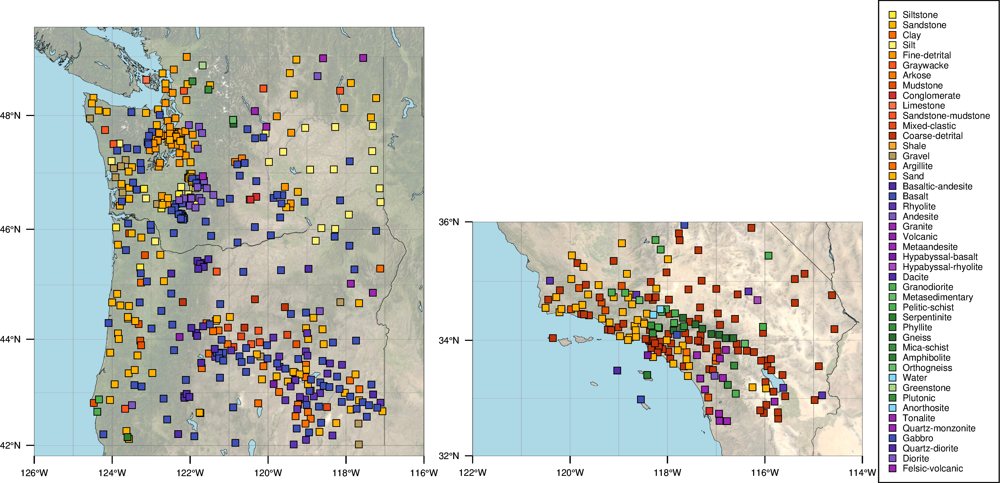

In [12]:
# Load CSV data
df = geo_major
region=[-126,-116,41.8,49.5]
proj='M6c'
# Initialize the figure
fig = pygmt.Figure()
pygmt.config(MAP_GRID_PEN = '0.01p,150' , MAP_FRAME_PEN='0.05p', MAP_FRAME_TYPE="plain", MAP_TITLE_OFFSET="0.12p", FONT_TITLE="12p", FONT_ANNOT='4p',  )
 
# Plot the basemap
fig.basemap(region=region,  projection=proj, frame="a2g1", )
grid = pygmt.datasets.load_earth_relief(resolution="30s", region=region)
fig.grdimage(grid='@earth_day_30s', projection=proj, transparency=60, )

fig.coast(region=region, projection=proj, frame="a2g1", resolution="f", borders="2/0.05p",
            water='lightblue', shorelines='0/0.1p',)
            
# Plot each geological unit as colored circles
for unit, color in major_colors.items():
    geo_plot = geo_major[geo_major['color'] == color]
    if not geo_plot.empty:
        fig.plot(
                x=geo_plot['stlo'],
                y=geo_plot['stla'],
                style="s0.15c",  
                fill=color,
                pen="black",
                label=unit
                )
fig.shift_origin(xshift="7c")
fig.legend(position="JMR", box="+gwhite+p0.4p",)
fig.shift_origin(xshift="-0.25c")

region=[-122,-114,32,36]
pygmt.config(MAP_GRID_PEN = '0.01p,150' , MAP_FRAME_PEN='0.05p', MAP_FRAME_TYPE="plain", MAP_TITLE_OFFSET="0.12p", FONT_TITLE="12p", FONT_ANNOT='4p',  )
 
# Plot the basemap
fig.basemap(region=region,  projection=proj, frame="a2g1", )
grid = pygmt.datasets.load_earth_relief(resolution="30s", region=region)
fig.grdimage(grid='@earth_day_30s', projection=proj, transparency=60, )

fig.coast(region=region, projection=proj, frame="a2g1", resolution="f", borders="2/0.05p",
            water='lightblue', shorelines='0/0.1p',)
# Plot each geological unit as colored circles
for unit, color in major_colors.items():
    geo_plot = geo_major[geo_major['color'] == color]
    formatted_label = str(unit).replace(", ", "--")
    if not geo_plot.empty:
        fig.plot(
            x=geo_plot["stlo"],
            y=geo_plot["stla"],
            style="s0.15c",
            fill=color,
            pen="black",
            label=f"{formatted_label}",  # Use formatted label
        )


fig.show(dpi=600)

In [13]:
pd_pnwbb=pd.read_csv('attenuation_PNW/sta_waro_vs30.csv')
pd_cabb=pd.read_csv('attenuation_SouthCA/sta_CI_vs30.csv')
pd_comb=pd.concat([pd_pnwbb,pd_cabb])

In [14]:
# Merging pd1 with pd2 on the 'netst' column
merged_geo = pd_comb.merge(geo_df, on='netst', how='left')
merged_geo = merged_geo[merged_geo.meanb > 0.01]

# Display the merged DataFrame
merged_geo.to_csv('merged_geo.csv', index=False)

In [15]:
merged_geo.head(5)

,Unnamed: 0,fband,netst,stlo_x,stla_x,meanb,meanQ,ncount,nearest_lon,nearest_lat,vs30,stlo_y,stla_y,STATE,GENERALIZE,MAJOR1
0,0,0.5-1.0,LI.LTH,-119.417679,46.461700,0.080000,58.905,2,-119.4174,46.4613,266.2870,-119.417679,46.461700,WA,"Unconsolidated, undifferentiated",Fine-detrital
2,2,0.5-1.0,TA.I05A,-121.267502,44.162601,0.316667,14.894,3,-121.2674,44.1633,425.7540,-121.267502,44.162601,OR,"Unconsolidated, undifferentiated",Clay
5,5,0.5-1.0,XN.B05,-125.766998,58.930500,0.050000,94.248,1,-123.0833,49.0012,324.2436,NaN,NaN,NaN,NaN,NaN
6,6,0.5-1.0,XN.B12,-131.744400,59.932999,0.110000,42.840,1,-124.7213,48.3872,605.8344,NaN,NaN,NaN,NaN,NaN
7,7,0.5-1.0,XN.C02,-122.713898,58.096500,0.020000,235.619,1,-122.7133,49.0012,426.8878,NaN,NaN,NaN,NaN,NaN


In [16]:
# Map geological units to colors
merged_geo['color_major'] = merged_geo['MAJOR1'].map(major_colors).fillna('#d3d3d3') 
merged_geo['color_gener'] = merged_geo['GENERALIZE'].map(geo_colors).fillna('#d3d3d3') 


In [17]:
# -122, -121.4, 46.7, 47
MtRainer=merged_geo[(merged_geo.stlo_x >-122) & (merged_geo.stlo_x <-121.4) & (merged_geo.stla_x >46.7) & (merged_geo.stla_x <47)]
# -121.9, -121.4, 45, 45.5
MtHood=merged_geo[(merged_geo.stlo_x >-121.9) & (merged_geo.stlo_x <-121.4) & (merged_geo.stla_x >45) & (merged_geo.stla_x <45.5)]
# -122.4, -121.9, 46, 46.4
MtStHelens=merged_geo[(merged_geo.stlo_x >-122.45) & (merged_geo.stlo_x <-121.9) & (merged_geo.stla_x >46) & (merged_geo.stla_x <46.4)]


In [18]:
print("MtStHelens-----")
for k, freq in enumerate(MtStHelens.fband.unique()):
    pdin=MtStHelens[MtStHelens.fband == freq]
    print((pdin.describe()))
print("MtHood-----")
for k, freq in enumerate(MtHood.fband.unique()):
    pdin=MtHood[MtHood.fband == freq]
    print((pdin.describe()))
print("MtRainer-----")
for k, freq in enumerate(MtRainer.fband.unique()):
    pdin=MtRainer[MtRainer.fband == freq]
    print((pdin.describe()))


MtStHelens-----
       Unnamed: 0      stlo_x     stla_x     meanb       meanQ    ncount  \
count    4.000000    4.000000   4.000000  4.000000    4.000000  4.000000   
mean   162.750000 -122.215569  46.224879  0.209375  118.265125  4.250000   
std     82.588841    0.054114   0.040849  0.083101  196.607344  2.872281   
min     48.000000 -122.296669  46.199780  0.102500   16.250000  1.000000   
25%    145.500000 -122.217310  46.200094  0.166250   17.866625  3.250000   
50%    179.000000 -122.190052  46.207209  0.222500   21.845500  4.000000   
75%    196.250000 -122.188311  46.231994  0.265625  122.244000  5.000000   
max    245.000000 -122.185501  46.285320  0.290000  413.119500  8.000000   

       nearest_lon  nearest_lat        vs30      stlo_y     stla_y  
count     4.000000     4.000000    4.000000    4.000000   4.000000  
mean   -122.215900    46.224300  771.343125 -122.215569  46.224879  
std       0.054391     0.041199  208.306976    0.054114   0.040849  
min    -122.297400    4

       Unnamed: 0      stlo_x     stla_x      meanb       meanQ     ncount  \
count   14.000000   14.000000  14.000000  14.000000   14.000000  14.000000   
mean   745.357143 -121.830208  46.856944   0.542552   44.998430   3.928571   
std     49.803625    0.137876   0.086877   0.226550   22.800485   3.561855   
min    649.000000 -121.988525  46.730263   0.292500   20.815333   1.000000   
25%    721.750000 -121.950998  46.794477   0.362308   26.816125   1.250000   
50%    756.000000 -121.849945  46.862952   0.461000   41.360700   3.000000   
75%    777.500000 -121.735271  46.923077   0.767500   53.444192   4.750000   
max    817.000000 -121.571175  46.988132   0.910000  100.991500  13.000000   

       nearest_lon  nearest_lat        vs30      stlo_y     stla_y  
count    14.000000    14.000000   14.000000   14.000000  14.000000  
mean   -121.830400    46.856857  669.477221 -121.830208  46.856944  
std       0.137869     0.086906  200.130201    0.137876   0.086877  
min    -121.989400   

In [19]:
# ! pip install geodatasets


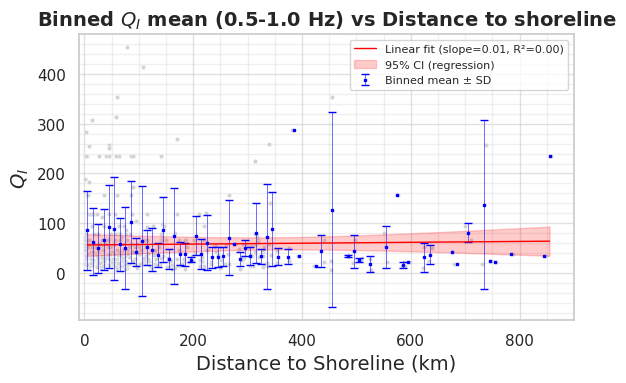

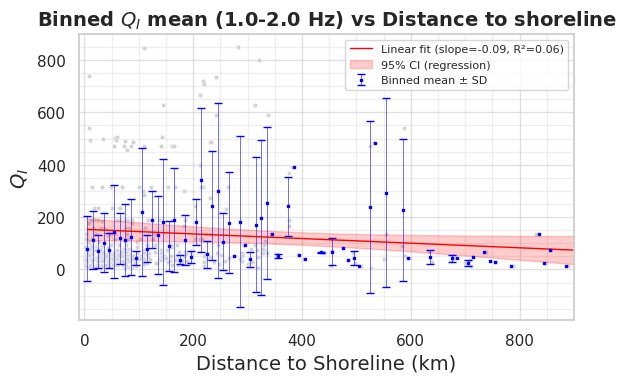

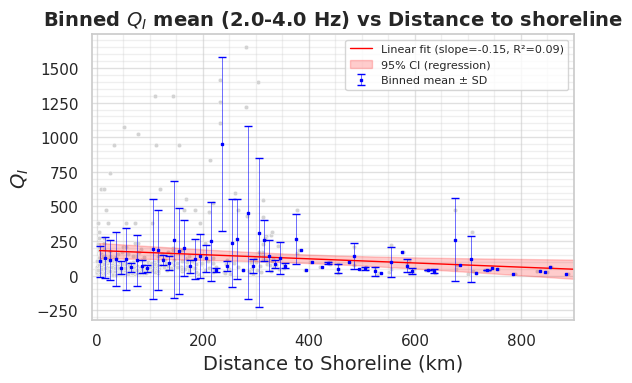

In [20]:
import geopandas as gpd
import geodatasets
from shapely.geometry import Point
from matplotlib.ticker import AutoMinorLocator
from scipy.stats import linregress, t

for k, freq in enumerate(merged_geo.fband.unique()):
    
    single_pnwbb=merged_geo.loc[merged_geo.fband == freq]

    # -----------------------------
    # 1. Prepare Data
    # -----------------------------
    df = single_pnwbb.copy()  # your dataframe with 'stlo_x', 'stla_x', 'meanQ'

    # Convert to GeoDataFrame
    gdf = gpd.GeoDataFrame(
        df,
        geometry=gpd.points_from_xy(df['stlo_x'], df['stla_x']),
        crs="EPSG:4326"
    )

    # Load coastline
    coast = gpd.read_file(geodatasets.get_path("naturalearth.land"))
    coastline = coast.boundary.union_all()

    # Compute approximate distance to shoreline in km
    gdf['dist_to_shore_km'] = gdf.geometry.apply(lambda p: p.distance(coastline) * 111)


    # -----------------------------
    # 1. Binning
    # -----------------------------
    bin_width = 10
    max_dist = gdf['dist_to_shore_km'].max()
    bins = np.arange(0, max_dist + bin_width, bin_width)
    labels = bins[:-1] + bin_width / 2
    gdf['dist_bin'] = pd.cut(gdf['dist_to_shore_km'], bins=bins, labels=labels)
    # gdf = gdf[gdf['dist_to_shore_km'] <= 400]
    
    binned = gdf.groupby('dist_bin', observed=False)['meanQ'].agg(['mean','median', 'std', 'count']).reset_index()
    binned['dist_bin'] = binned['dist_bin'].astype(float)
    binned_valid = binned.dropna(subset=['mean'])

    # -----------------------------
    # 2. Regression on binned mean
    # -----------------------------
    # binned_valid = binned[binned['count'] >= 3].dropna(subset=['median'])

    x = binned_valid['dist_bin'].values
    y = binned_valid['mean'].values
    slope, intercept, r_value, p_value, std_err = linregress(x, y)

    # Predicted values
    y_pred = intercept + slope * x

    # Degrees of freedom
    n = len(x)
    df = n - 2

    # Standard error of regression
    residuals = y - y_pred
    s_err = np.sqrt(np.sum(residuals**2) / df)

    # 95% confidence interval for regression line
    t_val = t.ppf(0.975, df)  # two-tailed 95%
    ci = t_val * s_err * np.sqrt(1/n + (x - np.mean(x))**2 / np.sum((x - np.mean(x))**2))

    # Upper and lower bounds
    y_upper = y_pred + ci
    y_lower = y_pred - ci

    # -----------------------------
    # 3. Plot
    # -----------------------------
    sns.set_theme(style="whitegrid")
    plt.figure(figsize=(6,4), dpi=100)

    # Raw points
    sns.scatterplot(data=gdf, x='dist_to_shore_km', y='meanQ', color='lightgray', s=10)

    # Binned mean
    plt.errorbar(
        x, y,
        yerr=binned_valid['std'],  # ±SD
        fmt='s', markersize=2, color='blue', ecolor='blue',linewidth=0.4,  capsize=3, label='Binned mean ± SD'
    )

    # Regression line
    plt.plot(x, y_pred, color='red', linewidth=1, label=f'Linear fit (slope={slope:.2f}, R²={r_value**2:.2f})')

    # 95% CI shading
    plt.fill_between(x, y_lower, y_upper, color='red', alpha=0.2, label='95% CI (regression)')

    # Labels
    plt.xlabel("Distance to Shoreline (km)", fontsize=14)
    plt.ylabel("$Q_I$", fontsize=14)
    plt.title(f"Binned $Q_I$ mean ({freq} Hz) vs Distance to shoreline", fontsize=14, weight='bold')

    plt.gca().xaxis.set_minor_locator(AutoMinorLocator())
    plt.gca().yaxis.set_minor_locator(AutoMinorLocator())
    plt.grid(which='minor', alpha=0.3)
    plt.grid(which='major', alpha=0.6)

    plt.legend(fontsize=8, loc='upper right')
    plt.tight_layout()
    # plt.ylim(-5,800)
    plt.xlim(-10,900)
    # plt.savefig("Qi_vs_distance_regression.png", dpi=300)
    plt.show()



In [21]:
! pip install statsmodels

In [22]:
# ! pip install xgboost

Fitting power law models for stations with >1 frequency band...


/tmp/ipykernel_3536192/2842261200.py:36: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, pcov = curve_fit(power_law, freqs, Qs, p0=[100, 0.5], maxfev=1000)



Derived Q0 and Eta parameters (Head):
     netst          Q0       Eta      Vs30
0  CC.ASBU   37.208525  3.302473  617.8513
1  CC.BRSP  293.480214  0.580495  900.0000
2  CC.CARB   32.754009  0.253481  653.7688
3  CC.CIHL   32.373045  2.001256  466.4361
4  CC.CLBH   44.388787 -0.609474  479.7639


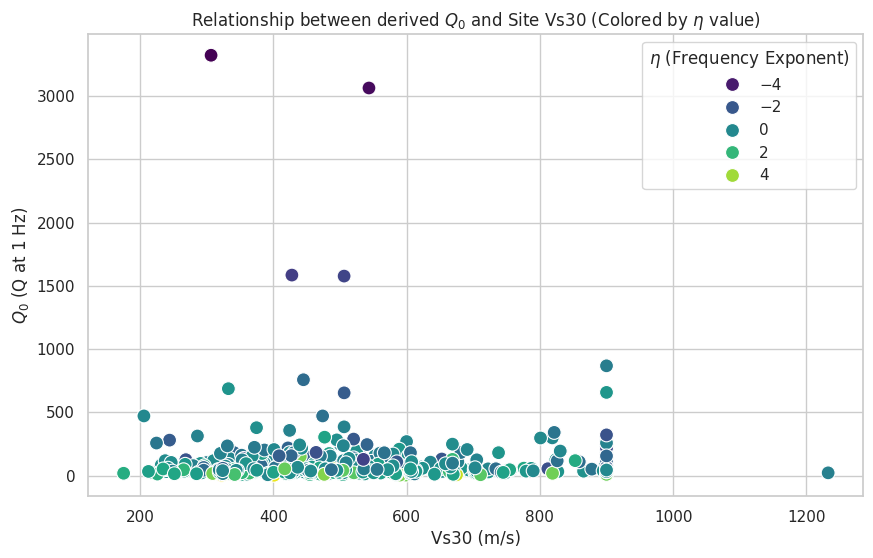

In [23]:
from scipy.optimize import curve_fit
df = merged_geo.copy()

# 1. Prepare Data: Convert fband string ranges to center frequency
def get_center_freq(fband_str):
    try:
        low, high = map(float, fband_str.split('-'))
        return (low + high) / 2
    except ValueError:
        return np.nan

df['center_freq'] = df['fband'].apply(get_center_freq)
df_freq = df.dropna(subset=['meanQ', 'center_freq', 'netst', 'vs30'])

# 2. Define the power law function Q(f) = Q0 * f^eta
def power_law(f, q0, eta):
    return q0 * (f**eta)

# Storage for the derived parameters
q0_values = []
eta_values = []
station_ids = []
vs30_values = [] 

# 3. Fit curve for each station that has data across multiple frequency bands
print("Fitting power law models for stations with >1 frequency band...")

for station_id, station_data in df_freq.groupby('netst'):
    # The sample data only has one frequency band, so this loop won't yield results
    # With a full dataset, this condition will be met:
    if len(station_data) > 1: 
        try:
            freqs = station_data['center_freq'].values
            Qs = station_data['meanQ'].values
            
            popt, pcov = curve_fit(power_law, freqs, Qs, p0=[100, 0.5], maxfev=1000)
            
            # --- FIX: Append only the single float value ---
            q0_values.append(popt[0]) 
            eta_values.append(popt[1])
            station_ids.append(station_id)
            vs30_values.append(station_data['vs30'].mean()) 
            
        except (RuntimeError, IndexError):
            print(f"Could not fit model for station {station_id} or insufficient data.")
            continue

# Create a new DataFrame with the derived physical parameters
results_df = pd.DataFrame({
    'netst': station_ids, 
    'Q0': q0_values, 
    'Eta': eta_values,
    'Vs30': vs30_values
})

# 4. Visualization of the derived parameters
if not results_df.empty:
    print("\nDerived Q0 and Eta parameters (Head):")
    print(results_df.head())
    
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=results_df, x='Vs30', y='Q0', hue='Eta', palette='viridis', s=100)
    plt.title('Relationship between derived $Q_0$ and Site Vs30 (Colored by $\eta$ value)')
    plt.xlabel('Vs30 (m/s)')
    plt.ylabel('$Q_0$ (Q at 1 Hz)')
    plt.legend(title='$\eta$ (Frequency Exponent)')
    plt.show()
else:
    print("\nNo stations had data across multiple frequency bands in the provided data to fit the model.")



Filtered dataset: 1081 stations

===== Frequency band: 0.5-1.0 =====
Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 98, ncost: 8203806.542917438
Run: 1, iteration: 2/100, moves: 33, ncost: 7557839.062614714
Run: 1, iteration: 3/100, moves: 3, ncost: 7546656.356633917


/tmp/ipykernel_3536192/4002129443.py:29: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  coastline = coast.boundary.unary_union


Run: 1, iteration: 4/100, moves: 0, ncost: 7546656.356633917
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 2, iteration: 1/100, moves: 29, ncost: 12303733.090282494
Run: 2, iteration: 2/100, moves: 31, ncost: 11558684.816946492
Run: 2, iteration: 3/100, moves: 60, ncost: 9489977.831704319
Run: 2, iteration: 4/100, moves: 81, ncost: 7946198.0603505615
Run: 2, iteration: 5/100, moves: 40, ncost: 7601708.280360654
Run: 2, iteration: 6/100, moves: 16, ncost: 7546829.358169234
Run: 2, iteration: 7/100, moves: 1, ncost: 7546211.20858897
Run: 2, iteration: 8/100, moves: 0, ncost: 7546211.20858897
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 3, iteration: 1/100, moves: 43, ncost: 7649343.122960456
Run: 3, iteration: 2/100, moves: 14, ncost: 7550297.873951368
Run: 3, iteration: 3/100, moves: 2, ncost: 7545309.582412463
Run: 3, iteration: 4/100, moves: 0, ncost: 7545309.582412463
Init: initializing centroids
Init: ini

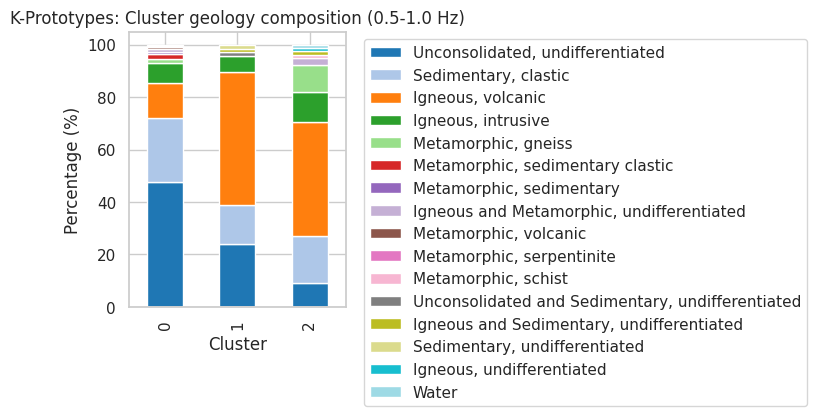

/uufs/chpc.utah.edu/common/home/u6041347/software/pkg/miniconda3/envs/codetest/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/uufs/chpc.utah.edu/common/home/u6041347/software/pkg/miniconda3/envs/codetest/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(



HDBSCAN: Numeric cluster summary
                      meanQ                          vs30                    \
                       mean         std count        mean         std count   
cluster_hdbscan                                                               
-1               133.210024  112.857926    56  538.324371  252.151870    56   
 0               242.039470    9.777994     9  450.289522   71.537281     9   
 1                21.896076   12.266473    11  454.098145   42.809383    11   
 2                41.374080   26.349616   258  518.456780  156.054990   258   

                dist_to_shore_km                    
                            mean         std count  
cluster_hdbscan                                     
-1                    248.707001  201.255101    56  
 0                     52.860312   41.505791     9  
 1                    537.151929   72.028192    11  
 2                    118.315212  103.049935   258  

HDBSCAN: Geological composition (%)
Clus

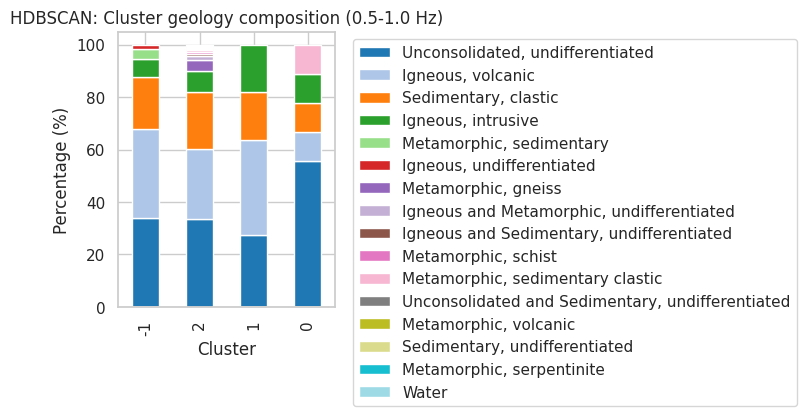


===== Frequency band: 1.0-2.0 =====
Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 74, ncost: 15785906.557606021
Run: 1, iteration: 2/100, moves: 18, ncost: 15666991.907647157
Run: 1, iteration: 3/100, moves: 32, ncost: 14971780.975000884
Run: 1, iteration: 4/100, moves: 37, ncost: 14416936.218873156
Run: 1, iteration: 5/100, moves: 38, ncost: 14099964.78300974
Run: 1, iteration: 6/100, moves: 18, ncost: 13999745.717077756
Run: 1, iteration: 7/100, moves: 11, ncost: 13961189.212229097
Run: 1, iteration: 8/100, moves: 4, ncost: 13952907.794488968
Run: 1, iteration: 9/100, moves: 0, ncost: 13952907.794488968
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 2, iteration: 1/100, moves: 50, ncost: 15703469.239072518
Run: 2, iteration: 2/100, moves: 20, ncost: 15570371.580848906
Run: 2, iteration: 3/100, moves: 11, 

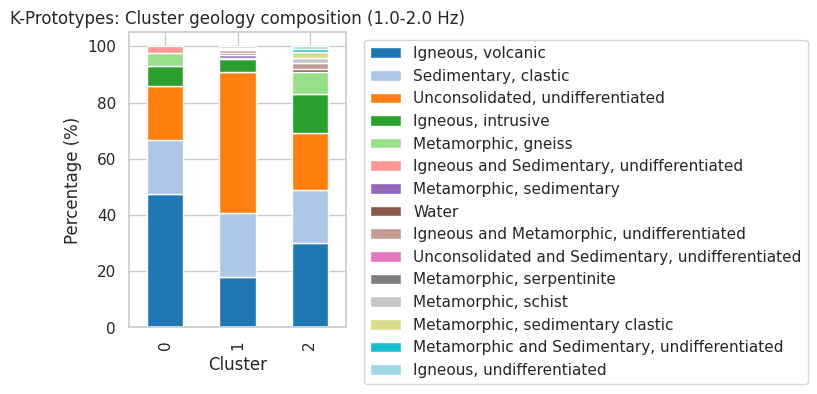

/uufs/chpc.utah.edu/common/home/u6041347/software/pkg/miniconda3/envs/codetest/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/uufs/chpc.utah.edu/common/home/u6041347/software/pkg/miniconda3/envs/codetest/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(



HDBSCAN: Numeric cluster summary
                      meanQ                          vs30                    \
                       mean         std count        mean         std count   
cluster_hdbscan                                                               
-1               459.498247  235.832340    37  622.915203  255.310743    37   
 0               481.817857   27.382755     7  527.064500   49.517723     7   
 1                75.243519   63.631656   316  502.811834  160.121956   316   

                dist_to_shore_km                    
                            mean         std count  
cluster_hdbscan                                     
-1                    271.390211  169.017083    37  
 0                     66.924564   51.737398     7  
 1                    120.506761  133.074982   316  

HDBSCAN: Geological composition (%)
Cluster 1: {'Unconsolidated, undifferentiated': 40.822784810126585, 'Sedimentary, clastic': 22.468354430379748, 'Igneous, volcanic': 20.

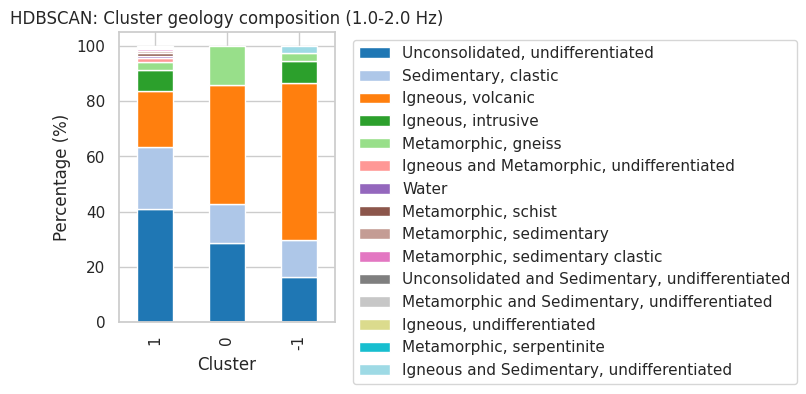


===== Frequency band: 2.0-4.0 =====
Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 78, ncost: 19439919.34513501
Run: 1, iteration: 2/100, moves: 26, ncost: 18992633.963057246
Run: 1, iteration: 3/100, moves: 10, ncost: 18897659.97160191
Run: 1, iteration: 4/100, moves: 4, ncost: 18889491.241405167
Run: 1, iteration: 5/100, moves: 0, ncost: 18889491.241405167
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 2, iteration: 1/100, moves: 99, ncost: 19102234.23506848
Run: 2, iteration: 2/100, moves: 45, ncost: 18397634.61058067
Run: 2, iteration: 3/100, moves: 3, ncost: 18394644.026063923
Run: 2, iteration: 4/100, moves: 0, ncost: 18394644.026063923
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 3, iteration: 1/100, moves: 70, ncost: 27523883.82680826
Run: 3, iteration: 2/100, 

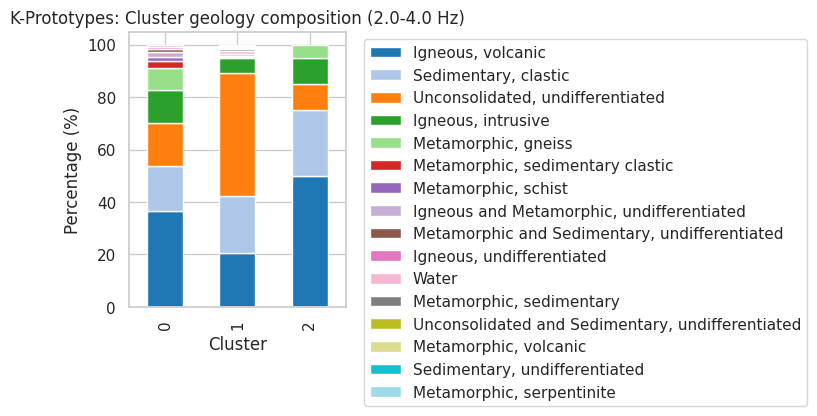

/uufs/chpc.utah.edu/common/home/u6041347/software/pkg/miniconda3/envs/codetest/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/uufs/chpc.utah.edu/common/home/u6041347/software/pkg/miniconda3/envs/codetest/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(



HDBSCAN: Numeric cluster summary
                      meanQ                          vs30                    \
                       mean         std count        mean         std count   
cluster_hdbscan                                                               
-1               217.129863  304.537505   191  529.374221  194.645106   191   
 0                90.508728   30.121428    12  433.275575   37.364212    12   
 1                46.577177   16.135247    12  881.382675   37.810107    12   
 2                52.561556   17.723814    12  705.113850   18.761696    12   
 3                62.445887   38.075580   160  448.882923   96.641060   160   

                dist_to_shore_km                    
                            mean         std count  
cluster_hdbscan                                     
-1                    219.983389  168.794751   191  
 0                    313.497945   17.281802    12  
 1                     76.250144   21.446868    12  
 2             

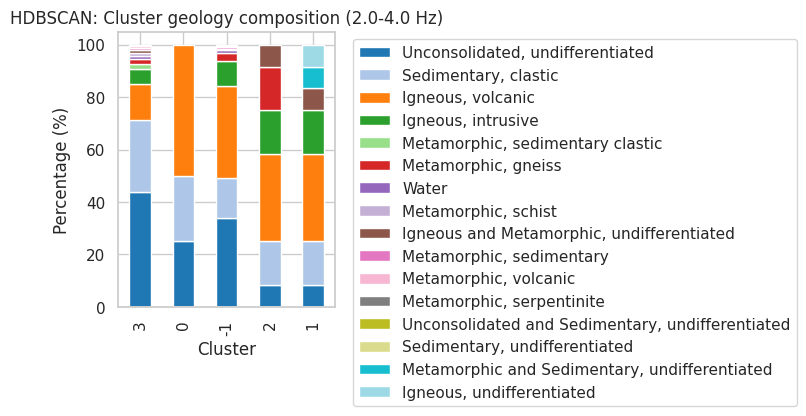

In [24]:
# -----------------------------
# Full Clustering Workflow
# -----------------------------

import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
from sklearn.preprocessing import StandardScaler
from kmodes.kprototypes import KPrototypes
import hdbscan
import seaborn as sns
import matplotlib.pyplot as plt
import geodatasets

# -----------------------------
# 0. Prepare dataset
# -----------------------------
df = merged_geo.copy()

# Keep only sedimentary & unconsolidated
df = df.dropna(subset=['meanQ','vs30','GENERALIZE'])
print(f"Filtered dataset: {len(df)} stations")

# Convert to GeoDataFrame for distance calculation
gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df['stlo_x'], df['stla_x']), crs="EPSG:4326")

# Load coastline
coast = gpd.read_file(geodatasets.get_path("naturalearth.land"))
coastline = coast.boundary.unary_union

# Compute distance to shore (km)
gdf['dist_to_shore_km'] = gdf.geometry.apply(lambda p: p.distance(coastline) * 111)

df = gdf.dropna(subset=['dist_to_shore_km'])

# -----------------------------
# Loop over frequency bands
# -----------------------------
clustered_results = {}

for freq in df.fband.unique():
    df_freq = df[df.fband==freq].copy()
    if len(df_freq) < 10:
        print(f"Skipping {freq}: too few stations")
        continue
    
    print(f"\n===== Frequency band: {freq} =====")
    
    # -----------------------------
    # 1. K-Prototypes clustering
    # -----------------------------
    features_kproto = df_freq[['meanQ','vs30','dist_to_shore_km','GENERALIZE']].copy()
    features_kproto['GENERALIZE'] = features_kproto['GENERALIZE'].astype(str)
    
    # Determine cluster number (here choose 3-5)
    n_clusters = 3
    
    kproto = KPrototypes(n_clusters=n_clusters, init='Cao', verbose=1, random_state=42)
    clusters_kproto = kproto.fit_predict(features_kproto, categorical=[3])
    
    df_freq['cluster_kproto'] = clusters_kproto
    
    # -----------------------------
    # 1a. Numeric summary per cluster
    # -----------------------------
    summary_numeric = df_freq.groupby('cluster_kproto')[['meanQ','vs30','dist_to_shore_km']].agg(['mean','std','count'])
    print("\nK-Prototypes: Numeric cluster summary")
    print(summary_numeric)
    
    # -----------------------------
    # 1b. Geological composition per cluster
    # -----------------------------
    cat_col = 'GENERALIZE'
    cluster_cat_summary = {}
    for c in range(n_clusters):
        cluster_data = df_freq[df_freq['cluster_kproto']==c]
        counts = cluster_data[cat_col].value_counts(normalize=True)*100
        cluster_cat_summary[c] = counts.to_dict()
    
    print("\nK-Prototypes: Geological composition (%)")
    for c, dist in cluster_cat_summary.items():
        print(f"Cluster {c}: {dist}")
    
    # -----------------------------
    # 1c. Plot stacked bar for GENERALIZE
    # -----------------------------
    cluster_df = pd.DataFrame(cluster_cat_summary).T.fillna(0)
    cluster_df.plot(kind='bar', stacked=True, figsize=(8,4), colormap='tab20')
    plt.title(f"K-Prototypes: Cluster geology composition ({freq} Hz)")
    plt.ylabel("Percentage (%)")
    plt.xlabel("Cluster")
    plt.legend(bbox_to_anchor=(1.05,1), loc='upper left')
    plt.tight_layout()
    plt.show()
    
    # -----------------------------
    # 2. HDBSCAN clustering (numeric only)
    # -----------------------------
    numeric_features = df_freq[['meanQ','vs30','dist_to_shore_km']].copy()
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(numeric_features)
    
    clusterer = hdbscan.HDBSCAN(min_cluster_size=5)
    df_freq['cluster_hdbscan'] = clusterer.fit_predict(X_scaled)
    
    summary_numeric_hdb = df_freq.groupby('cluster_hdbscan')[['meanQ','vs30','dist_to_shore_km']].agg(['mean','std','count'])
    print("\nHDBSCAN: Numeric cluster summary")
    print(summary_numeric_hdb)
    
    # Geological composition
    cluster_cat_hdb = {}
    for c in df_freq['cluster_hdbscan'].unique():
        cluster_data = df_freq[df_freq['cluster_hdbscan']==c]
        counts = cluster_data['GENERALIZE'].value_counts(normalize=True)*100
        cluster_cat_hdb[c] = counts.to_dict()
    
    print("\nHDBSCAN: Geological composition (%)")
    for c, dist in cluster_cat_hdb.items():
        print(f"Cluster {c}: {dist}")
    
    # -----------------------------
    # 2a. Stacked bar plot
    # -----------------------------
    cluster_df_hdb = pd.DataFrame(cluster_cat_hdb).T.fillna(0)
    cluster_df_hdb.plot(kind='bar', stacked=True, figsize=(8,4), colormap='tab20')
    plt.title(f"HDBSCAN: Cluster geology composition ({freq} Hz)")
    plt.ylabel("Percentage (%)")
    plt.xlabel("Cluster")
    plt.legend(bbox_to_anchor=(1.05,1), loc='upper left')
    plt.tight_layout()
    plt.show()
    
    clustered_results[freq] = df_freq


In [25]:
# ! pip install kmodes hdbscan


===== Frequency band: 0.5-1.0 - Map of clusters =====


/tmp/ipykernel_3536192/1524617712.py:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_kproto = plt.cm.get_cmap('tab10', n_colors_kproto)
/tmp/ipykernel_3536192/1524617712.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_hdbscan = plt.cm.get_cmap('tab10', n_colors_hdbscan)


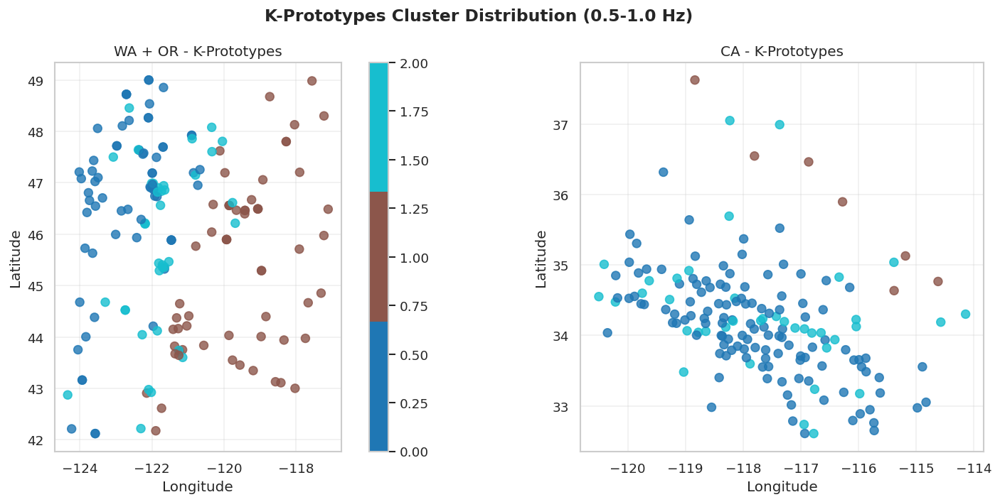

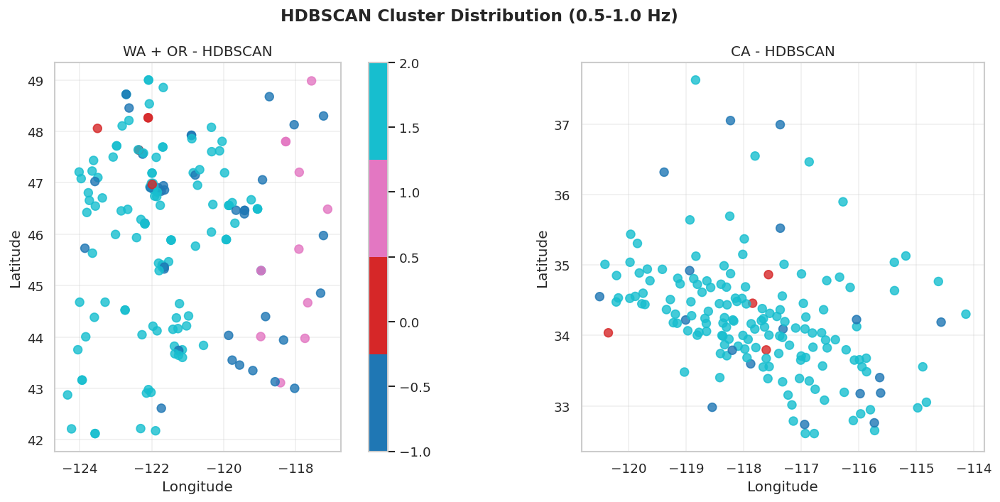


===== Frequency band: 1.0-2.0 - Map of clusters =====


/tmp/ipykernel_3536192/1524617712.py:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_kproto = plt.cm.get_cmap('tab10', n_colors_kproto)
/tmp/ipykernel_3536192/1524617712.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_hdbscan = plt.cm.get_cmap('tab10', n_colors_hdbscan)


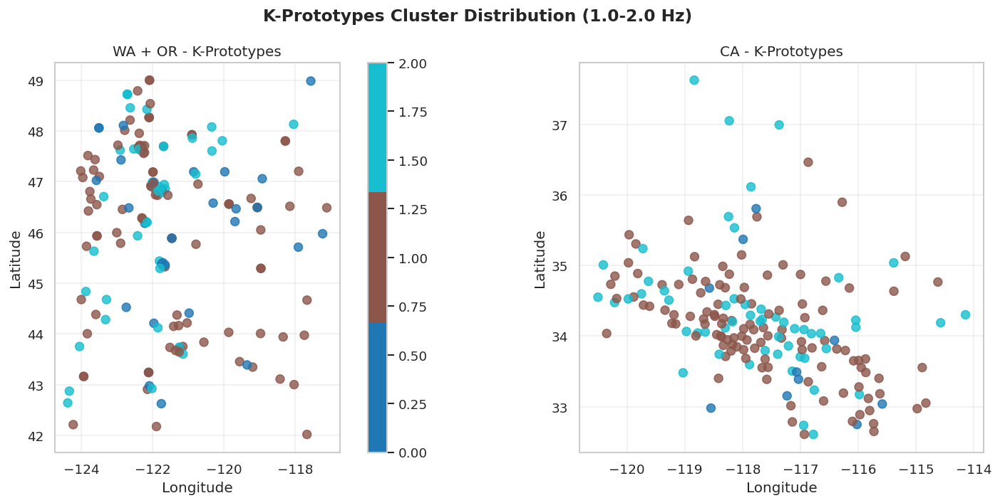

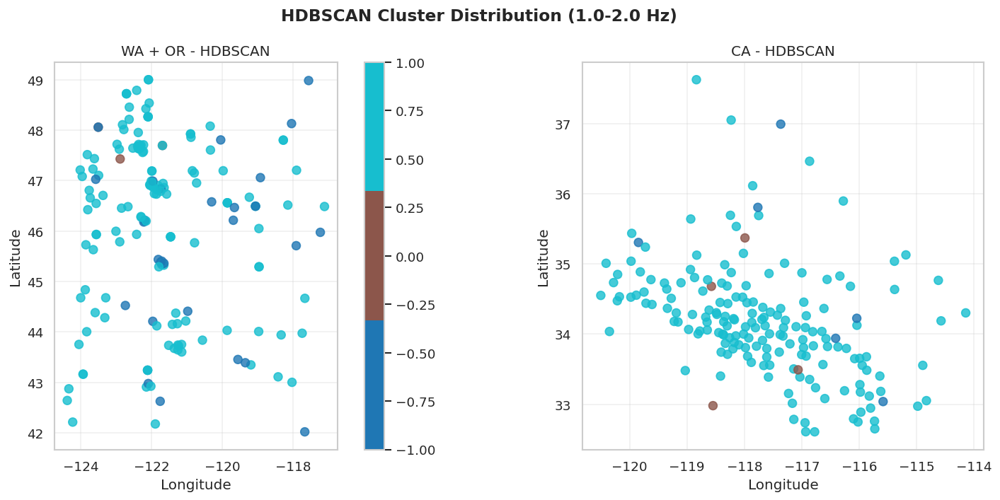


===== Frequency band: 2.0-4.0 - Map of clusters =====


/tmp/ipykernel_3536192/1524617712.py:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_kproto = plt.cm.get_cmap('tab10', n_colors_kproto)
/tmp/ipykernel_3536192/1524617712.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_hdbscan = plt.cm.get_cmap('tab10', n_colors_hdbscan)


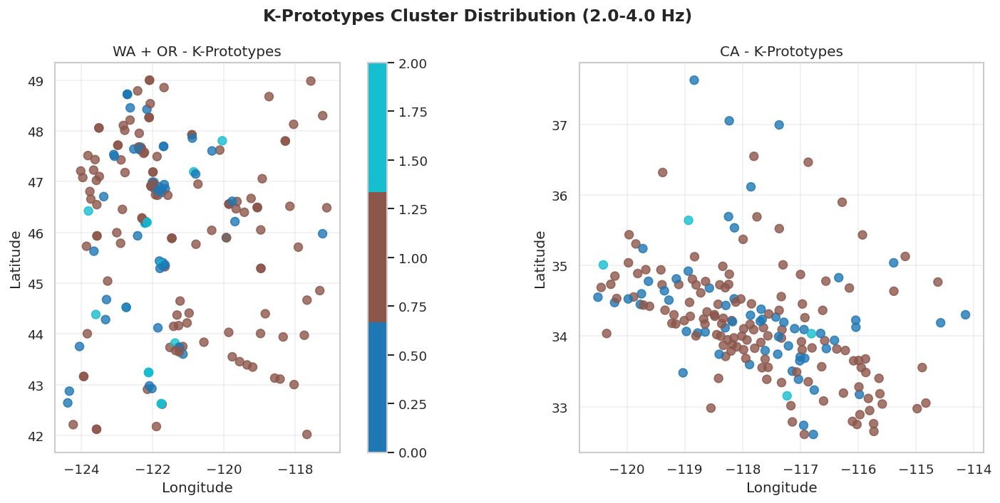

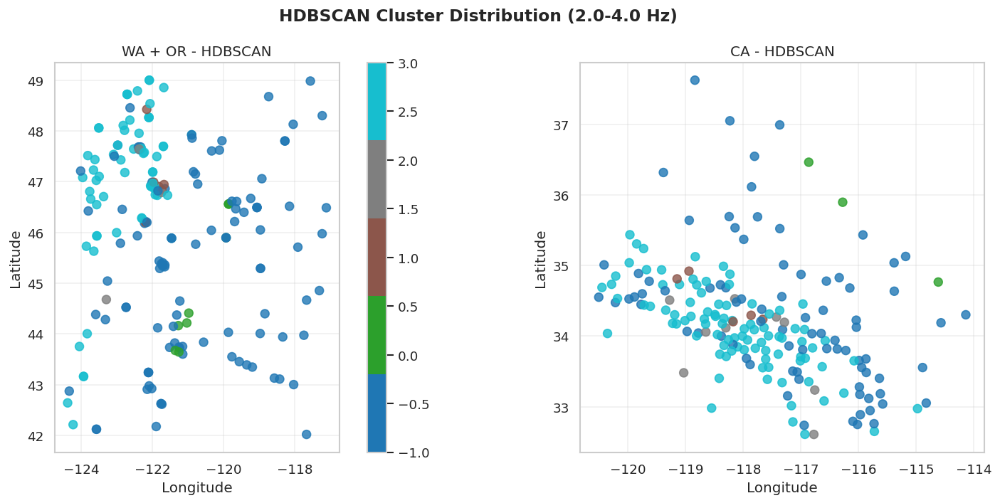

In [26]:
import matplotlib.colors as mcolors

# -----------------------------
# Map plotting: WA+OR vs CA
# -----------------------------
for freq, df_freq in clustered_results.items():
    print(f"\n===== Frequency band: {freq} - Map of clusters =====")

    # Define states
    wa_or = df_freq[df_freq['STATE'].isin(['WA','OR'])].copy()
    ca = df_freq[df_freq['STATE']=='CA'].copy()

    # Define cluster colors (consistent)
    clusters_kproto = sorted(df_freq['cluster_kproto'].unique())
    clusters_hdbscan = sorted(df_freq['cluster_hdbscan'].unique())

    # Use matplotlib tab10 or tab20 colormap
    n_colors_kproto = len(clusters_kproto)
    n_colors_hdbscan = len(clusters_hdbscan)
    cmap_kproto = plt.cm.get_cmap('tab10', n_colors_kproto)
    cmap_hdbscan = plt.cm.get_cmap('tab10', n_colors_hdbscan)

    # -----------------------------
    # 1. K-Prototypes clusters
    # -----------------------------
    fig, axes = plt.subplots(1,2,figsize=(14,6), dpi=120, )

    wa_or.plot(ax=axes[0], column='cluster_kproto', cmap=cmap_kproto, markersize=50, legend=True, alpha=0.8, vmin=0, vmax=n_colors_kproto-1)
    axes[0].set_title("WA + OR - K-Prototypes")
    axes[0].set_xlabel("Longitude"); axes[0].set_ylabel("Latitude")
    axes[0].grid(alpha=0.3)

    ca.plot(ax=axes[1], column='cluster_kproto', cmap=cmap_kproto, markersize=50, legend=False, alpha=0.8, vmin=0, vmax=n_colors_kproto-1)
    axes[1].set_title("CA - K-Prototypes")
    axes[1].set_xlabel("Longitude"); axes[1].set_ylabel("Latitude")
    axes[1].grid(alpha=0.3)

    plt.suptitle(f"K-Prototypes Cluster Distribution ({freq} Hz)", fontsize=14, weight='bold')
    plt.tight_layout()
    plt.show()

    # -----------------------------
    # 2. HDBSCAN clusters
    # -----------------------------
    fig, axes = plt.subplots(1,2,figsize=(14,6), dpi=120, )

    wa_or.plot(ax=axes[0], column='cluster_hdbscan', cmap=cmap_hdbscan, markersize=50, legend=True, alpha=0.8, vmin=min(clusters_hdbscan), vmax=max(clusters_hdbscan))
    axes[0].set_title("WA + OR - HDBSCAN")
    axes[0].set_xlabel("Longitude"); axes[0].set_ylabel("Latitude")
    axes[0].grid(alpha=0.3)

    ca.plot(ax=axes[1], column='cluster_hdbscan', cmap=cmap_hdbscan, markersize=50, legend=False, alpha=0.8, vmin=min(clusters_hdbscan), vmax=max(clusters_hdbscan))
    axes[1].set_title("CA - HDBSCAN")
    axes[1].set_xlabel("Longitude"); axes[1].set_ylabel("Latitude")
    axes[1].grid(alpha=0.3)

    plt.suptitle(f"HDBSCAN Cluster Distribution ({freq} Hz)", fontsize=14, weight='bold')
    plt.tight_layout()
    plt.show()



===== Frequency band: 0.5-1.0 =====


,method,cluster,n_sites,meanQ_mean,meanQ_std,vs30_mean,vs30_std,dist_to_shore_mean,dist_to_shore_std,dominant_generalize,dominant_generalize_%
0,cluster_kproto,1,67,52.878765,64.871605,444.038413,100.497082,396.423442,122.202767,"Igneous, volcanic",50.746269
1,cluster_kproto,2,78,63.910642,77.289085,767.329724,114.559301,132.898303,98.497259,"Igneous, volcanic",43.589744
2,cluster_kproto,0,189,63.627400,66.855975,441.023319,100.844996,73.602606,58.058689,"Unconsolidated, undifferentiated",47.619048
3,cluster_hdbscan,-1,56,133.210024,112.857926,538.324371,252.151870,248.707001,201.255101,"Unconsolidated, undifferentiated",33.928571
4,cluster_hdbscan,2,258,41.374080,26.349616,518.456780,156.054990,118.315212,103.049935,"Unconsolidated, undifferentiated",33.333333
5,cluster_hdbscan,1,11,21.896076,12.266473,454.098145,42.809383,537.151929,72.028192,"Igneous, volcanic",36.363636
6,cluster_hdbscan,0,9,242.039470,9.777994,450.289522,71.537281,52.860312,41.505791,"Unconsolidated, undifferentiated",55.555556


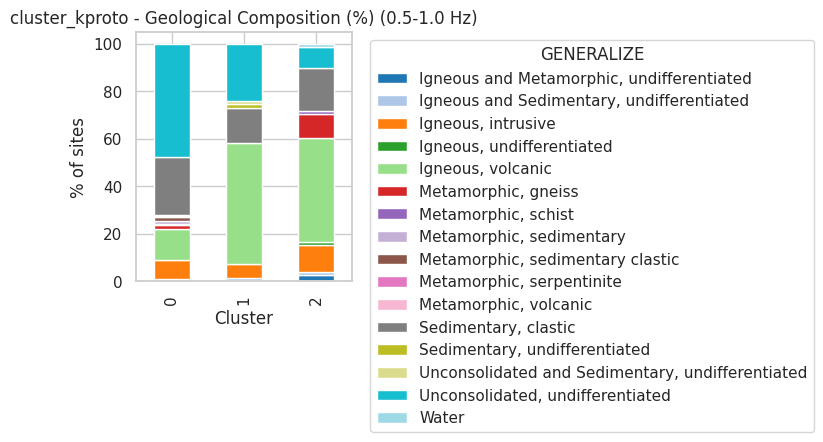

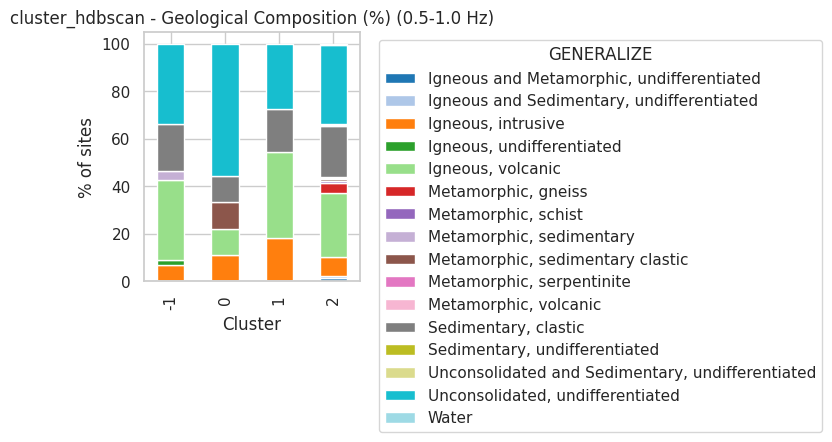


===== Frequency band: 1.0-2.0 =====


,method,cluster,n_sites,meanQ_mean,meanQ_std,vs30_mean,vs30_std,dist_to_shore_mean,dist_to_shore_std,dominant_generalize,dominant_generalize_%
0,cluster_kproto,1,218,70.503241,54.764069,415.702703,87.869755,135.940941,154.230064,"Unconsolidated, undifferentiated",50.000000
1,cluster_kproto,2,100,74.524857,62.286776,712.838455,127.471917,105.786475,101.071485,"Igneous, volcanic",30.000000
2,cluster_kproto,0,42,507.831429,156.405740,564.733786,189.026579,199.435088,154.357957,"Igneous, volcanic",47.619048
3,cluster_hdbscan,1,316,75.243519,63.631656,502.811834,160.121956,120.506761,133.074982,"Unconsolidated, undifferentiated",40.822785
4,cluster_hdbscan,0,7,481.817857,27.382755,527.064500,49.517723,66.924564,51.737398,"Igneous, volcanic",42.857143
5,cluster_hdbscan,-1,37,459.498247,235.832340,622.915203,255.310743,271.390211,169.017083,"Igneous, volcanic",56.756757


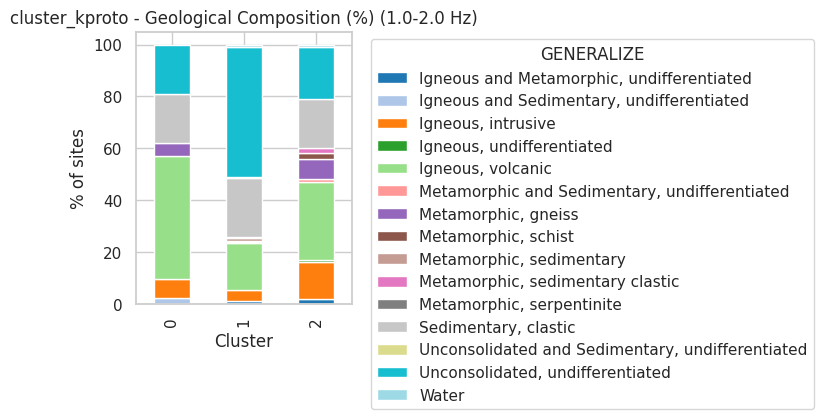

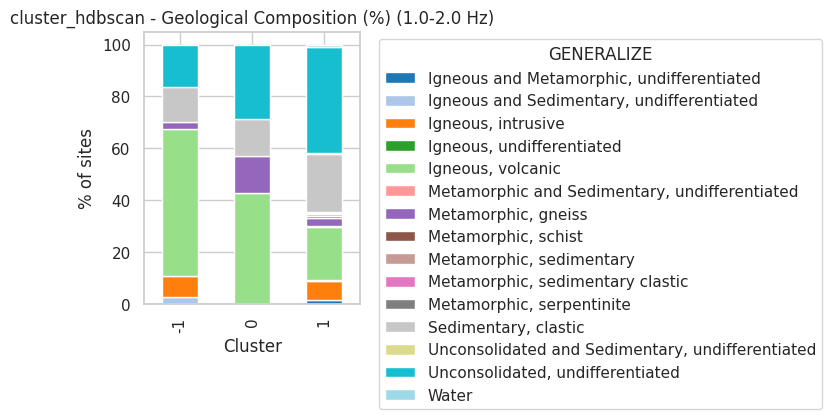


===== Frequency band: 2.0-4.0 =====


,method,cluster,n_sites,meanQ_mean,meanQ_std,vs30_mean,vs30_std,dist_to_shore_mean,dist_to_shore_std,dominant_generalize,dominant_generalize_%
0,cluster_kproto,1,257,94.583400,89.634164,417.816759,92.391647,155.719377,166.343427,"Unconsolidated, undifferentiated",46.692607
1,cluster_kproto,0,110,88.456854,90.699667,712.682580,127.759259,110.547046,105.235015,"Igneous, volcanic",36.363636
2,cluster_kproto,2,20,985.036376,335.209674,569.750910,209.229066,163.965267,102.463685,"Igneous, volcanic",50.000000
3,cluster_hdbscan,3,160,62.445887,38.075580,448.882922,96.641060,50.700590,38.052631,"Unconsolidated, undifferentiated",43.750000
4,cluster_hdbscan,0,12,90.508728,30.121428,433.275575,37.364212,313.497945,17.281802,"Igneous, volcanic",50.000000
5,cluster_hdbscan,-1,191,217.129863,304.537505,529.374221,194.645106,219.983389,168.794751,"Igneous, volcanic",35.078534
6,cluster_hdbscan,2,12,52.561556,17.723814,705.113850,18.761696,54.455112,34.332287,"Igneous, volcanic",33.333333
7,cluster_hdbscan,1,12,46.577177,16.135247,881.382675,37.810107,76.250144,21.446868,"Igneous, volcanic",33.333333


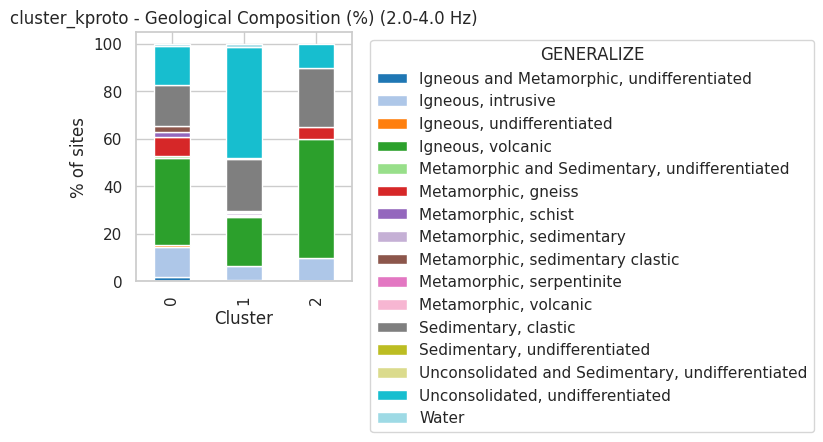

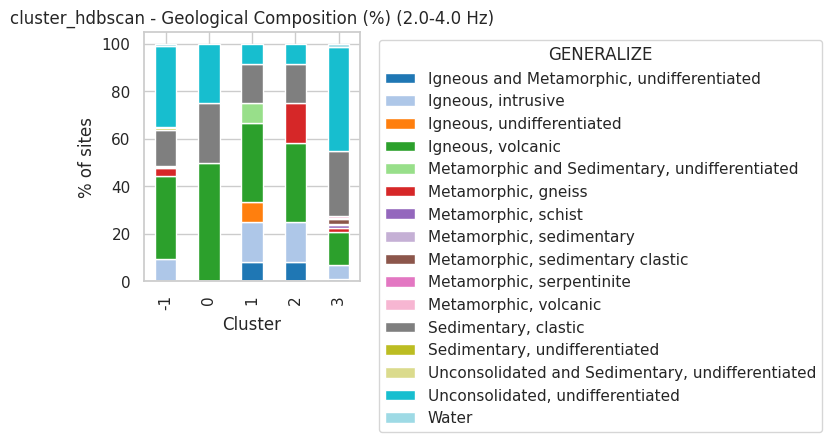

In [27]:
# -----------------------------
# 2. Create summary tables per frequency
# -----------------------------
final_summary = {}

for freq, df_freq in clustered_results.items():
    print(f"\n===== Frequency band: {freq} =====")

    summary_list = []

    for method in ['cluster_kproto', 'cluster_hdbscan']:
        clusters = df_freq[method].unique()
        for c in clusters:
            cluster_data = df_freq[df_freq[method] == c]

            # Numeric stats
            meanQ_mean = cluster_data['meanQ'].mean()
            meanQ_std = cluster_data['meanQ'].std()
            vs30_mean = cluster_data['vs30'].mean()
            vs30_std = cluster_data['vs30'].std()
            shore_mean = cluster_data['dist_to_shore_km'].mean()
            shore_std = cluster_data['dist_to_shore_km'].std()
            n_sites = len(cluster_data)

            # Dominant GENERALIZE
            generalize_counts = cluster_data['GENERALIZE'].value_counts()
            dominant_gen = generalize_counts.idxmax()
            dominant_gen_pct = generalize_counts.max() / generalize_counts.sum() * 100

            summary_list.append({
                'method': method,
                'cluster': c,
                'n_sites': n_sites,
                'meanQ_mean': meanQ_mean,
                'meanQ_std': meanQ_std,
                'vs30_mean': vs30_mean,
                'vs30_std': vs30_std,
                'dist_to_shore_mean': shore_mean,
                'dist_to_shore_std': shore_std,
                'dominant_generalize': dominant_gen,
                'dominant_generalize_%': dominant_gen_pct
            })

    summary_df = pd.DataFrame(summary_list)
    final_summary[freq] = summary_df
    display(summary_df)

    # Optional: plot a stacked bar for GENERALIZE composition per cluster & method
    for method in ['cluster_kproto', 'cluster_hdbscan']:
        comp_df = df_freq.groupby([method, 'GENERALIZE']).size().unstack(fill_value=0)
        comp_df = comp_df.div(comp_df.sum(axis=1), axis=0) * 100
        comp_df.plot(kind='bar', stacked=True, figsize=(8,4), colormap='tab20')
        plt.title(f"{method} - Geological Composition (%) ({freq} Hz)")
        plt.ylabel("% of sites")
        plt.xlabel("Cluster")
        plt.legend(title='GENERALIZE', bbox_to_anchor=(1.05,1))
        plt.tight_layout()
        plt.show()


Filtered to 641 sedimentary/unconsolidated stations out of 1225 total


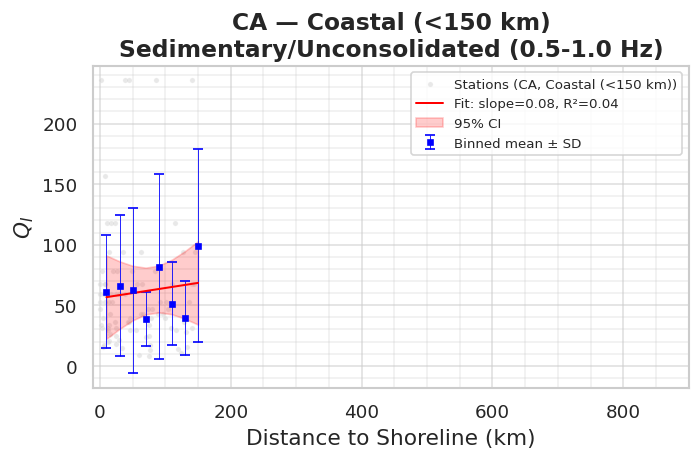

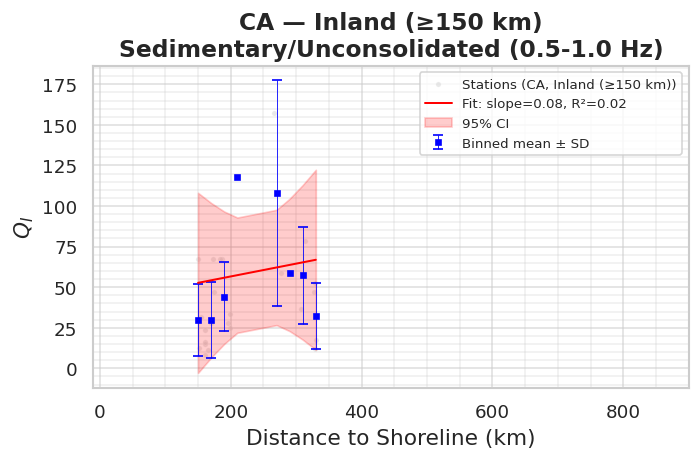

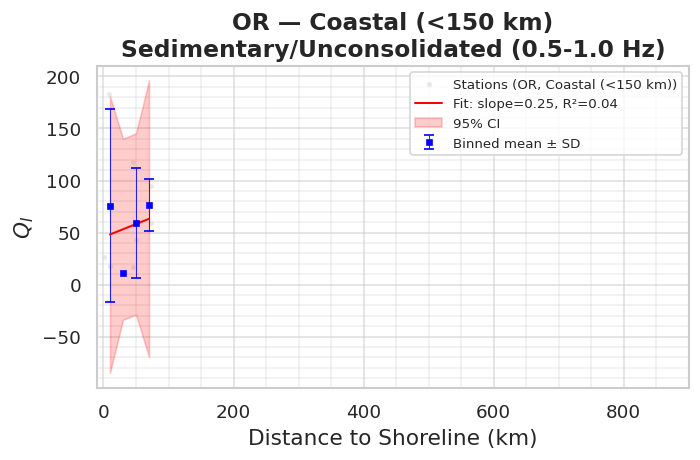

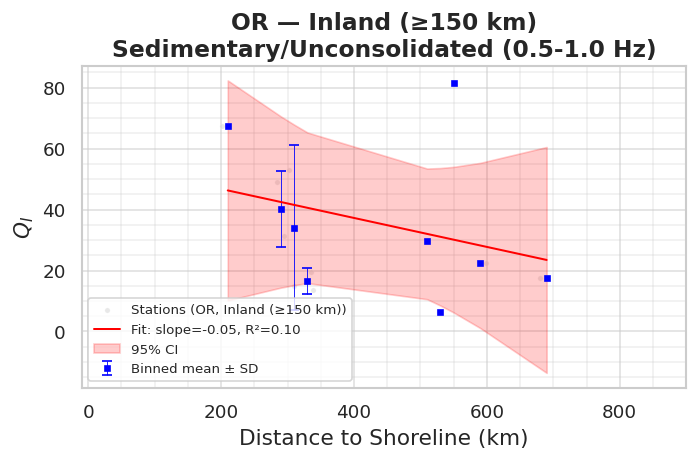

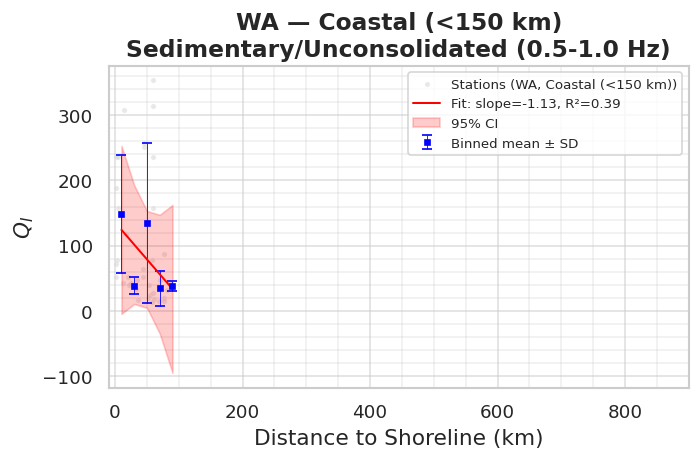

...

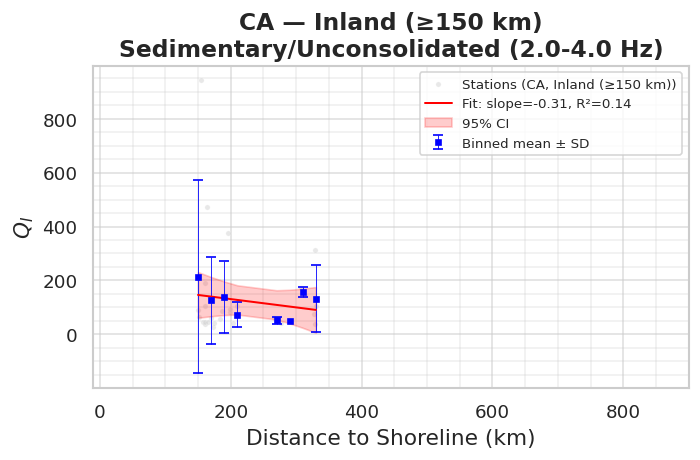

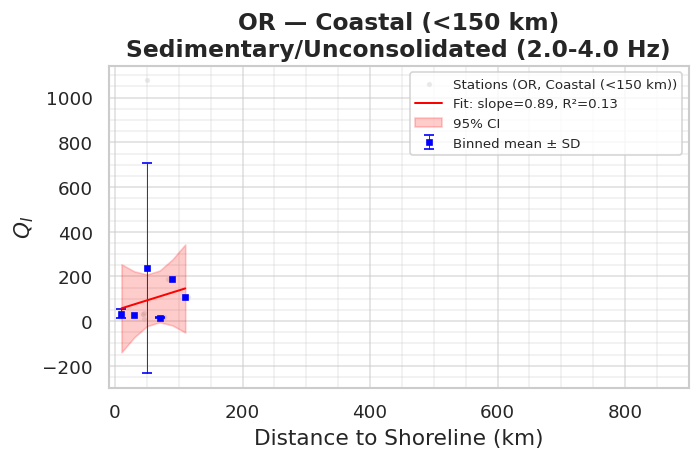

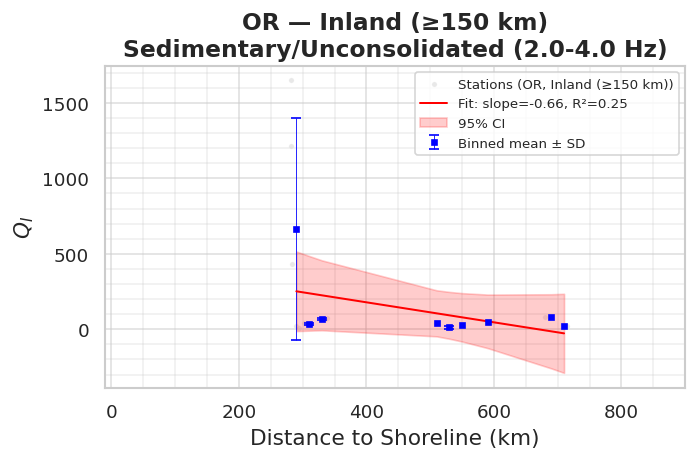

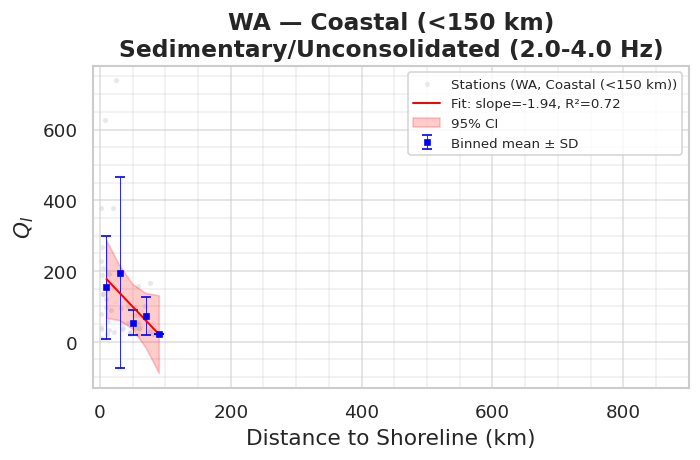

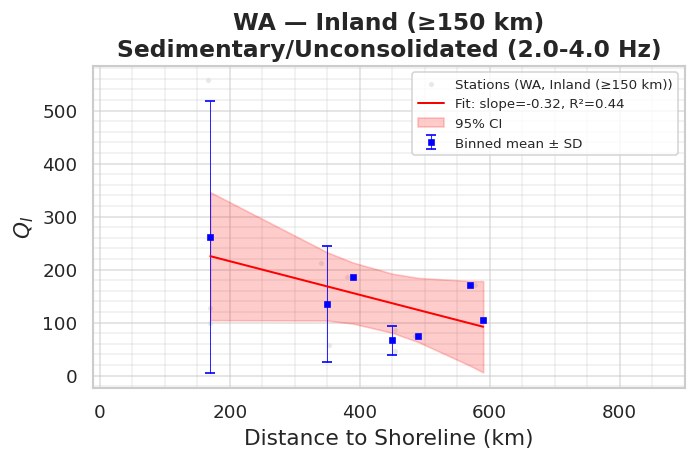

In [28]:
import geopandas as gpd
import geodatasets
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import AutoMinorLocator
from scipy.stats import linregress, t
from shapely.geometry import Point

# ==============================
# 1. Filter: only Sedimentary or Unconsolidated
# ==============================
merged_geo_filtered = merged_geo[
    merged_geo['GENERALIZE'].str.contains('Sedimentary|Unconsolidated', case=False, na=False)
].copy()

print(f"Filtered to {len(merged_geo_filtered)} sedimentary/unconsolidated stations out of {len(merged_geo)} total")

# ==============================
# 2. Loop by frequency
# ==============================
for freq in merged_geo_filtered.fband.unique():
    single_band = merged_geo_filtered.loc[merged_geo_filtered.fband == freq].copy()

    # Convert to GeoDataFrame
    gdf = gpd.GeoDataFrame(
        single_band,
        geometry=gpd.points_from_xy(single_band['stlo_x'], single_band['stla_x']),
        crs="EPSG:4326"
    )

    # -----------------------------
    # Load coastline (Natural Earth)
    # -----------------------------
    coast = gpd.read_file(geodatasets.get_path("naturalearth.land"))
    coastline = coast.boundary.union_all()

    # Compute distance to shoreline in km
    gdf['dist_to_shore_km'] = gdf.geometry.apply(lambda p: p.distance(coastline) * 111)

    # -----------------------------
    # Define coastal vs inland zones
    # -----------------------------
    gdf['zone'] = np.where(gdf['dist_to_shore_km'] < 150,
                           'Coastal (<150 km)',
                           'Inland (≥150 km)')

    # -----------------------------
    # Regression per State and Zone
    # -----------------------------
    for (state, zone), subset in gdf.groupby(['STATE', 'zone']):
        if subset.empty or subset['meanQ'].isna().all():
            continue

        # -----------------------------
        # Binning by distance
        # -----------------------------
        bin_width = 20
        max_dist = subset['dist_to_shore_km'].max()
        bins = np.arange(0, max_dist + bin_width, bin_width)
        labels = bins[:-1] + bin_width / 2
        subset['dist_bin'] = pd.cut(subset['dist_to_shore_km'], bins=bins, labels=labels)
        
        binned = subset.groupby('dist_bin', observed=False)['meanQ'].agg(['mean', 'std', 'count']).reset_index()
        binned['dist_bin'] = binned['dist_bin'].astype(float)
        binned_valid = binned.dropna(subset=['mean'])

        if len(binned_valid) < 3:
            continue

        # -----------------------------
        # Linear regression on binned mean
        # -----------------------------
        x = binned_valid['dist_bin'].values
        y = binned_valid['mean'].values
        slope, intercept, r_value, p_value, std_err = linregress(x, y)

        # Predictions and 95% CI
        y_pred = intercept + slope * x
        n = len(x)
        dfree = n - 2
        residuals = y - y_pred
        s_err = np.sqrt(np.sum(residuals**2) / dfree)
        t_val = t.ppf(0.975, dfree)
        ci = t_val * s_err * np.sqrt(1/n + (x - np.mean(x))**2 / np.sum((x - np.mean(x))**2))
        y_upper = y_pred + ci
        y_lower = y_pred - ci

        # -----------------------------
        # Plot
        # -----------------------------
        sns.set_theme(style="whitegrid")
        plt.figure(figsize=(6,4), dpi=120)

        # Raw points
        sns.scatterplot(data=subset, x='dist_to_shore_km', y='meanQ',
                        color='lightgray', s=10, alpha=0.5, label=f"Stations ({state}, {zone})")

        # Binned mean ± SD
        plt.errorbar(
            x, y, yerr=binned_valid['std'],
            fmt='s', markersize=3, color='blue', ecolor='blue',
            linewidth=0.5, capsize=3, label='Binned mean ± SD'
        )

        # Regression line + CI
        plt.plot(x, y_pred, color='red', linewidth=1.2,
                 label=f'Fit: slope={slope:.2f}, R²={r_value**2:.2f}')
        plt.fill_between(x, y_lower, y_upper, color='red', alpha=0.2, label='95% CI')

        # Labels and aesthetics
        plt.xlabel("Distance to Shoreline (km)", fontsize=13)
        plt.ylabel("$Q_I$", fontsize=13)
        plt.title(f"{state} — {zone}\nSedimentary/Unconsolidated ({freq} Hz)", fontsize=14, weight='bold')
        plt.gca().xaxis.set_minor_locator(AutoMinorLocator())
        plt.gca().yaxis.set_minor_locator(AutoMinorLocator())
        plt.grid(which='minor', alpha=0.3)
        plt.grid(which='major', alpha=0.6)
        plt.legend(fontsize=8, loc='best')
        plt.tight_layout()
        plt.xlim(-10, 900)
        plt.show()
